# Computer Vision, Lab 5: Two-View Reconstruction in the Real World

Today we'll take a look at how to perform real-world 3D reconstruction of a scene **using point correspondences between two calibrated views** of that scene.

The theory we explored in lecture thus far has had one glaring omission: **how to get correspondences between two or more views of a scene?**

We'll explore: 

1. keypoint detection and matching, 
2. estimating the essential matrix, 
3. estimating the camera rotation and translation, and 
4. resolving the scale ambiguity using extrinsic camera parameters.

## Data needed for the lab

**Alternative 1**: Use the camera you calibrated in Lab 03 to get **two views of the same scene of interest**. Make sure the scene is **not purely planar**.

**Alternative 2**: Use one of the two **home robot navigation videos** we've already worked with. You may also want to **just use the sequence of frames**
we segmented from. You'll also need to **calibrate the camera** to get the intrinsic parameters of the camera.
- [Video 1 (nighttime, LED lighting)](https://drive.google.com/file/d/1K2EjcMJifDUOkSP_amlg8wcHmv_jh44V/view?usp=sharing)
- [Video 2 (daytime, ambient lighting)](https://drive.google.com/file/d/1LKH5zPhZRPKSHF287apsaOL5ZMN3c7JB/view?usp=sharing)
- [Segmented frames from video 1](https://drive.google.com/drive/folders/1V0GyVhnrO9NgXLRzJNFVpLOqFJJScUg2?usp=sharing)
- [Calibration images for the camera used for all video/image data](https://github.com/dsai-asia/CV/tree/master/Labs/05-Calibration/sample-calib-images-jetson-rpicam)

## Feature matching: AKAZE vs. ORB?

We'll look at two feature point matchers today. They are both similar to the original idea
of wide baseline matching with SIFT, first invented by David Lowe at the University of British Colombia around 2000.
**SIFT (and its faster successor SURF) are free for academic or individual use, but they are patent protected**, so you have
to license the algorithms if you want to make money with them! For that reason, the OpenCV community has implemented quite
a few other feature point detectors and matchers so you have wide range of choices that are patent-free. We'll look at
AKAZE and ORB a bit.

Reference: [Comparing ORB and AKAZE for visual odometry
of unmanned aerial vehicles](http://www.epacis.net/ccis2016/papers/paper_121.pdf)

In **ORB**, the detection step is based on **the FAST keypoint detector,
which is an efficient corner detector** suitable for real-time applications due
to its computation properties. Since FAST does not include an orientation
operator, **ORB adds an orientation component to it, which
is called oFAST (oriented FAST)**.

**AKAZE** makes use of **a "Fast Explicit Diffusion" (FED) scheme embedded in a pyramidal framework in order to build an accelerated feature detection system in nonlinear scale spaces**. By means of FED schemes, **a nonlinear scale space can be built much faster** than with any other kind of discretization scheme.

## Keypoint detection and matching

Study the [ORB/AKAZE OpenCV tutorial](https://docs.opencv.org/4.3.0/dc/d16/tutorial_akaze_tracking.html).
It shows us how to do the following:

- **Detect and describe keypoints on the first frame, manually set object boundaries**
- For **every next frame**:
  1. Detect and describe **keypoints**
  2. Match them using **bruteforce matcher**
  3. **Estimate homography transformation** using **RANSAC**
  4. **Filter out the outliers** among the matches
  5. **Apply homography transformation** to the bounding box to find the object
  6. **Draw bounding box and inliers** and **compute the inlier ratio** as an evaluation metric

While this is useful for tracking a 2D planar object with a fixed camera, **the keypoint
matching method is appropriate for full 3D point correspondence estimation, estimation of F or E,
and so on. We'll just have to replace the homography transformation with F or E.**

First we'll talk about feature matching a bit, get the tutorial code running (code is replicated below and nicely translated
into Python by Alisa), then we'll
get AKAZE and ORB keypoints from the first two frames with motion in the sequence of frames from Video 1.

When you adapt the tutorial code to our situation,
note that the it has some things such as **setting the ROI and tracking from a video** that are **not relevant for us**.
Focus on the keypoint detector setup and keypoint matcher setup.


## C++ / main.cpp

In [ ]:
#include <opencv2/opencv.hpp>
#include <vector>
#include <iostream>
#include <iomanip>
#include "stats.h" // Stats structure definition
#include "utils.h" // Drawing and printing functions
using namespace std;
using namespace cv;
const double akaze_thresh = 3e-4; // AKAZE detection threshold set to locate about 1000 keypoints
const double ransac_thresh = 2.5f; // RANSAC inlier threshold
const double nn_match_ratio = 0.8f; // Nearest-neighbour matching ratio
const int bb_min_inliers = 100; // Minimal number of inliers to draw bounding box
const int stats_update_period = 10; // On-screen statistics are updated every 10 frames
namespace example {
    class Tracker
    {
    public:
        Tracker(Ptr<Feature2D> _detector, Ptr<DescriptorMatcher> _matcher) :
            detector(_detector),
            matcher(_matcher)
        {}
        void setFirstFrame(const Mat frame, vector<Point2f> bb, string title, Stats& stats);
        Mat process(const Mat frame, Stats& stats);
        Ptr<Feature2D> getDetector() {
            return detector;
        }
    protected:
        Ptr<Feature2D> detector;
        Ptr<DescriptorMatcher> matcher;
        Mat first_frame, first_desc;
        vector<KeyPoint> first_kp;
        vector<Point2f> object_bb;
    };
    void Tracker::setFirstFrame(const Mat frame, vector<Point2f> bb, string title, Stats& stats)
    {
        cv::Point* ptMask = new cv::Point[bb.size()];
        const Point* ptContain = { &ptMask[0] };
        int iSize = static_cast<int>(bb.size());
        for (size_t i = 0; i < bb.size(); i++) {
            ptMask[i].x = static_cast<int>(bb[i].x);
            ptMask[i].y = static_cast<int>(bb[i].y);
        }
        first_frame = frame.clone();
        cv::Mat matMask = cv::Mat::zeros(frame.size(), CV_8UC1);
        cv::fillPoly(matMask, &ptContain, &iSize, 1, cv::Scalar::all(255));
        detector->detectAndCompute(first_frame, matMask, first_kp, first_desc);

        Mat res;
        drawKeypoints(first_frame, first_kp, res, Scalar(255, 0, 0), DrawMatchesFlags::DRAW_RICH_KEYPOINTS);
        imshow("key points", res);
        waitKey(0);
        destroyWindow("key points");

        stats.keypoints = (int)first_kp.size();
        drawBoundingBox(first_frame, bb);
        putText(first_frame, title, Point(0, 60), FONT_HERSHEY_PLAIN, 5, Scalar::all(0), 4);
        object_bb = bb;
        delete[] ptMask;
    }
    Mat Tracker::process(const Mat frame, Stats& stats)
    {
        TickMeter tm;
        vector<KeyPoint> kp;
        Mat desc;
        tm.start();
        detector->detectAndCompute(frame, noArray(), kp, desc);
        stats.keypoints = (int)kp.size();
        vector< vector<DMatch> > matches;
        vector<KeyPoint> matched1, matched2;
        matcher->knnMatch(first_desc, desc, matches, 2);
        for (unsigned i = 0; i < matches.size(); i++) {
            if (matches[i][0].distance < nn_match_ratio * matches[i][1].distance) {
                matched1.push_back(first_kp[matches[i][0].queryIdx]);
                matched2.push_back(kp[matches[i][0].trainIdx]);
            }
        }
        stats.matches = (int)matched1.size();
        Mat inlier_mask, homography;
        vector<KeyPoint> inliers1, inliers2;
        vector<DMatch> inlier_matches;
        if (matched1.size() >= 4) {
            homography = findHomography(Points(matched1), Points(matched2),
                RANSAC, ransac_thresh, inlier_mask);
        }
        tm.stop();
        stats.fps = 1. / tm.getTimeSec();
        if (matched1.size() < 4 || homography.empty()) {
            Mat res;
            hconcat(first_frame, frame, res);
            stats.inliers = 0;
            stats.ratio = 0;
            return res;
        }
        for (unsigned i = 0; i < matched1.size(); i++) {
            if (inlier_mask.at<uchar>(i)) {
                int new_i = static_cast<int>(inliers1.size());
                inliers1.push_back(matched1[i]);
                inliers2.push_back(matched2[i]);
                inlier_matches.push_back(DMatch(new_i, new_i, 0));
            }
        }
        stats.inliers = (int)inliers1.size();
        stats.ratio = stats.inliers * 1.0 / stats.matches;
        vector<Point2f> new_bb;
        perspectiveTransform(object_bb, new_bb, homography);
        Mat frame_with_bb = frame.clone();
        if (stats.inliers >= bb_min_inliers) {
            drawBoundingBox(frame_with_bb, new_bb);
        }
        Mat res;
        drawMatches(first_frame, inliers1, frame_with_bb, inliers2,
            inlier_matches, res,
            Scalar(255, 0, 0), Scalar(255, 0, 0));
        return res;
    }
}
int main(int argc, char** argv)
{
    string video_name = "robot.mp4";
    VideoCapture video_in;
    video_in.open(video_name);
    if (!video_in.isOpened()) {
        cerr << "Couldn't open " << video_name << endl;
        return 1;
    }
    Stats stats, akaze_stats, orb_stats;
    Ptr<AKAZE> akaze = AKAZE::create();
    akaze->setThreshold(akaze_thresh);
    Ptr<ORB> orb = ORB::create();
    Ptr<DescriptorMatcher> matcher = DescriptorMatcher::create("BruteForce-Hamming");
    example::Tracker akaze_tracker(akaze, matcher);
    example::Tracker orb_tracker(orb, matcher);
    Mat frame;
    namedWindow(video_name, WINDOW_NORMAL);
    cout << "\nPress any key to stop the video and select a bounding box" << endl;
    while (waitKey(1) < 1)
    {
        video_in >> frame;
        cv::resizeWindow(video_name, frame.size());
        imshow(video_name, frame);
    }
    vector<Point2f> bb;
    cv::Rect uBox = cv::selectROI(video_name, frame);
    bb.push_back(cv::Point2f(static_cast<float>(uBox.x), static_cast<float>(uBox.y)));
    bb.push_back(cv::Point2f(static_cast<float>(uBox.x + uBox.width), static_cast<float>(uBox.y)));
    bb.push_back(cv::Point2f(static_cast<float>(uBox.x + uBox.width), static_cast<float>(uBox.y + uBox.height)));
    bb.push_back(cv::Point2f(static_cast<float>(uBox.x), static_cast<float>(uBox.y + uBox.height)));
    akaze_tracker.setFirstFrame(frame, bb, "AKAZE", stats);
    orb_tracker.setFirstFrame(frame, bb, "ORB", stats);
    Stats akaze_draw_stats, orb_draw_stats;
    Mat akaze_res, orb_res, res_frame;
    int i = 0;
    for (;;) {
        i++;
        bool update_stats = (i % stats_update_period == 0);
        video_in >> frame;
        // stop the program if no more images
        if (frame.empty()) break;
        akaze_res = akaze_tracker.process(frame, stats);
        akaze_stats += stats;
        if (update_stats) {
            akaze_draw_stats = stats;
        }
        orb->setMaxFeatures(stats.keypoints);
        orb_res = orb_tracker.process(frame, stats);
        orb_stats += stats;
        if (update_stats) {
            orb_draw_stats = stats;
        }
        drawStatistics(akaze_res, akaze_draw_stats);
        drawStatistics(orb_res, orb_draw_stats);
        vconcat(akaze_res, orb_res, res_frame);
        cv::imshow(video_name, res_frame);
        if (waitKey(1) == 27) break; //quit on ESC button
    }
    akaze_stats /= i - 1;
    orb_stats /= i - 1;
    printStatistics("AKAZE", akaze_stats);
    printStatistics("ORB", orb_stats);
    return 0;
}

## C++ / stats.h

In [ ]:
#ifndef STATS_H
#define STATS_H

struct Stats
{
    int matches;
    int inliers;
    double ratio;
    int keypoints;
    double fps;

    Stats() : matches(0),
        inliers(0),
        ratio(0),
        keypoints(0),
        fps(0.)
    {}

    Stats& operator+=(const Stats& op) {
        matches += op.matches;
        inliers += op.inliers;
        ratio += op.ratio;
        keypoints += op.keypoints;
        fps += op.fps;
        return *this;
    }
    Stats& operator/=(int num)
    {
        matches /= num;
        inliers /= num;
        ratio /= num;
        keypoints /= num;
        fps /= num;
        return *this;
    }
};

#endif // STATS_H#pragma once

## C++ / utils.h

In [ ]:
#ifndef UTILS_H
#define UTILS_H

#include <opencv2/opencv.hpp>
#include <vector>
#include "stats.h"

using namespace std;
using namespace cv;

void drawBoundingBox(Mat image, vector<Point2f> bb);
void drawStatistics(Mat image, const Stats& stats);
void printStatistics(string name, Stats stats);
vector<Point2f> Points(vector<KeyPoint> keypoints);
Rect2d selectROI(const String& video_name, const Mat& frame);

void drawBoundingBox(Mat image, vector<Point2f> bb)
{
    for (unsigned i = 0; i < bb.size() - 1; i++) {
        line(image, bb[i], bb[i + 1], Scalar(0, 0, 255), 2);
    }
    line(image, bb[bb.size() - 1], bb[0], Scalar(0, 0, 255), 2);
}

void drawStatistics(Mat image, const Stats& stats)
{
    static const int font = FONT_HERSHEY_PLAIN;
    stringstream str1, str2, str3, str4;

    str1 << "Matches: " << stats.matches;
    str2 << "Inliers: " << stats.inliers;
    str3 << "Inlier ratio: " << setprecision(2) << stats.ratio;
    str4 << "FPS: " << std::fixed << setprecision(2) << stats.fps;

    putText(image, str1.str(), Point(0, image.rows - 120), font, 2, Scalar::all(255), 3);
    putText(image, str2.str(), Point(0, image.rows - 90), font, 2, Scalar::all(255), 3);
    putText(image, str3.str(), Point(0, image.rows - 60), font, 2, Scalar::all(255), 3);
    putText(image, str4.str(), Point(0, image.rows - 30), font, 2, Scalar::all(255), 3);
}

void printStatistics(string name, Stats stats)
{
    cout << name << endl;
    cout << "----------" << endl;

    cout << "Matches " << stats.matches << endl;
    cout << "Inliers " << stats.inliers << endl;
    cout << "Inlier ratio " << setprecision(2) << stats.ratio << endl;
    cout << "Keypoints " << stats.keypoints << endl;
    cout << "FPS " << std::fixed << setprecision(2) << stats.fps << endl;
    cout << endl;
}

vector<Point2f> Points(vector<KeyPoint> keypoints)
{
    vector<Point2f> res;
    for (unsigned i = 0; i < keypoints.size(); i++) {
        res.push_back(keypoints[i].pt);
    }
    return res;
}
#endif // UTILS_H#pragma once


## Python / stats.py

Some quick tips:
 - Use a multiline comment (""" some data """) after a class namde or function name declaration to make your intellisense checker happy.
 - use <tt>:type</tt> to define the type of a parameter to a function or method.
 - You can overload operators like <tt>+</tt>, <tt>-</tt>, <tt>*</tt>, and <tt>/</tt> yourself. Just declare a method with <tt>__method__(self,...)</tt>.
   Try it, it's very useful!

In [7]:
import numpy as np

class Stats:
    """
    Statistic class

    Attributes
    ----------
    matches=0 (int):
        total number of matching

    inliers=0 (int):
        number of inliner matching

    ratio=0. (float):
        Nearest-neighbour matching ratio

    keypoints=0 (int):
        Wall

    fps=0. (float):
        frame per 1 sec
    
    Methods
    -------
    add(Stats) - overload + function:
        plus the information into this class

    divide(Stats) - overload + function:
        divide the information into this class
    """
    matches:int
    inliers:int
    ratio:float
    keypoints:int
    fps:float

    def __init__(self, matches = 0, inliers = 0, ratio = 0., keypoints = 0, fps = 0.):
        self.matches = matches
        self.inliers = inliers
        self.ratio = ratio
        self.keypoints = keypoints
        self.fps = fps

    def __add__(self, op:"Stats") -> "Stats":
        self.matches += op.matches
        self.inliers += op.inliers
        self.ratio += op.ratio
        self.keypoints += op.keypoints
        self.fps += op.fps
        return self

    def __truediv__(self, num:int) -> "Stats":
        self.matches //= num
        self.inliers //= num
        self.ratio /= num
        self.keypoints //= num
        self.fps /= num
        return self

    def __str__(self) -> str:
        return "matches({0}) inliner({1}) ratio({2:.2f}) keypoints({3}) fps({4:.2f})".format(self.matches, self.inliers, self.ratio, self.keypoints, self.fps)

    __repr__ = __str__

    def to_strings(self):
        """
        Convert to string set of matches, inliners, ratio, and fps
        """
        str1 = "Matches: {0}".format(self.matches)
        str2 = "Inliers: {0}".format(self.inliers)
        str3 = "Inlier ratio: {0:.2f}".format(self.ratio)
        str4 = "Keypoints: {0}".format(self.keypoints)
        str5 = "FPS: {0:.2f}".format(self.fps)
        return str1, str2, str3, str4, str5

    def copy(self):
        return Stats(self.matches, self.inliers, self.ratio, self.keypoints, self.fps)

In [8]:
# test the class

#from stats import Stats

test1 = Stats(5, 2, 9, 4, 1.5)
test2 = Stats(2, 1, 0, 8, 9)

test1 + test2
print(test1)
test1 / 3
print(test1)

matches(7) inliner(3) ratio(9.00) keypoints(12) fps(10.50)
matches(2) inliner(1) ratio(3.00) keypoints(4) fps(3.50)


## Python / Utils.py

In [ ]:
from stats import Stats
import cv2
from typing import List #use it for :List[...]

def drawBoundingBox(image, bb):
    """
    Draw the bounding box from the points set

    Parameters
    ----------
        image (array):
            image which you want to draw
        bb (List):
            points array set
    """
    color = (0, 0, 255)
    for i in range(len(bb) - 1):
        b1 = (int(bb[i][0]), int(bb[i][1]))
        b2 = (int(bb[i + 1][0]), int(bb[i + 1][1]))
        cv2.line(image, b1, b2, color, 2)
    b1 = (int(bb[len(bb) - 1][0]), int(bb[len(bb) - 1][1]))
    b2 = (int(bb[0][0]), int(bb[0][1]))
    cv2.line(image, b1, b2, color, 2)

def drawStatistics(image, stat: Stats):
    """
    Draw the statistic to images

    Parameters
    ----------
        image (array):
            image which you want to draw
        stat (Stats):
            statistic values
    """
    font = cv2.FONT_HERSHEY_PLAIN

    str1, str2, str3, str4, str5 = stat.to_strings()

    shape = image.shape

    cv2.putText(image, str1, (0, shape[0] - 120), font, 2, (0, 0, 255), 3)
    cv2.putText(image, str2, (0, shape[0] - 90), font, 2, (0, 0, 255), 3)
    cv2.putText(image, str3, (0, shape[0] - 60), font, 2, (0, 0, 255), 3)
    cv2.putText(image, str5, (0, shape[0] - 30), font, 2, (0, 0, 255), 3)

def printStatistics(name: str, stat: Stats):
    """
    Print the statistic

    Parameters
    ----------
        name (str):
            image which you want to draw
        stat (Stats):
            statistic values
    """
    print(name)
    print("----------")
    str1, str2, str3, str4, str5 = stat.to_strings()
    print(str1)
    print(str2)
    print(str3)
    print(str4)
    print(str5)
    print()

def Points(keypoints):
    res = []
    for i in keypoints:
        res.append(i)
    return res


## Python / main.py

In [ ]:
import cv2
import numpy as np
import time
from stats import Stats
from utils import drawBoundingBox, drawStatistics, printStatistics, Points

akaze_thresh:float = 3e-4 # AKAZE detection threshold set to locate about 1000 keypoints
ransac_thresh:float = 2.5 # RANSAC inlier threshold
nn_match_ratio:float = 0.8 # Nearest-neighbour matching ratio
bb_min_inliers:int = 100 # Minimal number of inliers to draw bounding box
stats_update_period:int = 10 # On-screen statistics are updated every 10 frames

class Tracker:
    def __init__(self, detector, matcher):
        self.detector = detector
        self.matcher = matcher

    def setFirstFrame(self, frame, bb, title:str):
        iSize = len(bb)
        stat = Stats()
        ptContain = np.zeros((iSize, 2))
        i = 0
        for b in bb:
            #ptMask[i] = (b[0], b[1])
            ptContain[i, 0] = b[0]
            ptContain[i, 1] = b[1]
            i += 1
        
        self.first_frame = frame.copy()
        matMask = np.zeros(frame.shape, dtype=np.uint8)
        cv2.fillPoly(matMask, np.int32([ptContain]), (255,0,0))

        # cannot use in ORB
        # self.first_kp, self.first_desc = self.detector.detectAndCompute(self.first_frame, matMask)

        # find the keypoints with ORB
        kp = self.detector.detect(self.first_frame,None)
        # compute the descriptors with ORB
        self.first_kp, self.first_desc = self.detector.compute(self.first_frame, kp)

        # print(self.first_kp[0].pt[0])
        # print(self.first_kp[0].pt[1])
        # print(self.first_kp[0].angle)
        # print(self.first_kp[0].size)
        res = cv2.drawKeypoints(self.first_frame, self.first_kp, None, color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        
        stat.keypoints = len(self.first_kp)
        drawBoundingBox(self.first_frame, bb);

        cv2.imshow("key points of {0}".format(title), res)
        cv2.waitKey(0)
        cv2.destroyWindow("key points of {0}".format(title))

        cv2.putText(self.first_frame, title, (0, 60), cv2.FONT_HERSHEY_PLAIN, 5, (0,0,0), 4)
        self.object_bb = bb
        return stat

    def process(self, frame):
        stat = Stats()
        start_time = time.time()
        kp, desc = self.detector.detectAndCompute(frame, None)
        stat.keypoints = len(kp)
        matches = self.matcher.knnMatch(self.first_desc, desc, k=2)

        matched1 = []
        matched2 = []
        matched1_keypoints = []
        matched2_keypoints = []
        good = []

        for i,(m,n) in enumerate(matches):
            if m.distance < nn_match_ratio * n.distance:
                good.append(m)
                matched1_keypoints.append(self.first_kp[matches[i][0].queryIdx])
                matched2_keypoints.append(kp[matches[i][0].trainIdx])

        matched1 = np.float32([ self.first_kp[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        matched2 = np.float32([ kp[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

        stat.matches = len(matched1)
        homography = None
        if (len(matched1) >= 4):
            homography, inlier_mask = cv2.findHomography(matched1, matched2, cv2.RANSAC, ransac_thresh)
        dt = time.time() - start_time
        stat.fps = 1. / dt
        if (len(matched1) < 4 or homography is None):
            res = cv2.hconcat([self.first_frame, frame])
            stat.inliers = 0
            stat.ratio = 0
            return res, stat
        inliers1 = []
        inliers2 = []
        inliers1_keypoints = []
        inliers2_keypoints = []
        for i in range(len(good)):
            if (inlier_mask[i] > 0):
                new_i = len(inliers1)
                inliers1.append(matched1[i])
                inliers2.append(matched2[i])
                inliers1_keypoints.append(matched1_keypoints[i])
                inliers2_keypoints.append(matched2_keypoints[i])
        inlier_matches = [cv2.DMatch(_imgIdx=0, _queryIdx=idx, _trainIdx=idx,_distance=0) for idx in range(len(inliers1))]
        inliers1 = np.array(inliers1, dtype=np.float32)
        inliers2 = np.array(inliers2, dtype=np.float32)

        stat.inliers = len(inliers1)
        stat.ratio = stat.inliers * 1.0 / stat.matches
        bb = np.array([self.object_bb], dtype=np.float32)
        new_bb = cv2.perspectiveTransform(bb, homography)
        frame_with_bb = frame.copy()
        if (stat.inliers >= bb_min_inliers):
            drawBoundingBox(frame_with_bb, new_bb[0])

        res = cv2.drawMatches(self.first_frame, inliers1_keypoints, frame_with_bb, inliers2_keypoints, inlier_matches, None, matchColor=(255, 0, 0), singlePointColor=(255, 0, 0))
        return res, stat

    def getDetector(self):
        return self.detector

def main():
    video_name = "robot.mp4"
    video_in = cv2.VideoCapture()
    video_in.open(video_name)
    if (not video_in.isOpened()):
        print("Couldn't open ", video_name)
        return -1

    akaze_stats = Stats()
    orb_stats = Stats()

    akaze = cv2.AKAZE_create()
    akaze.setThreshold(akaze_thresh)

    orb = cv2.ORB_create()

    matcher = cv2.DescriptorMatcher_create("BruteForce-Hamming")

    akaze_tracker = Tracker(akaze, matcher)
    orb_tracker = Tracker(orb, matcher)

    cv2.namedWindow(video_name, cv2.WINDOW_NORMAL);
    print("\nPress any key to stop the video and select a bounding box")

    key = -1

    while(key < 1):
        _, frame = video_in.read()
        w, h, ch = frame.shape
        cv2.resizeWindow(video_name, (h, w))
        cv2.imshow(video_name, frame)
        key = cv2.waitKey(1)

    print("Select a ROI and then press SPACE or ENTER button!")
    print("Cancel the selection process by pressing c button!")
    uBox = cv2.selectROI(video_name, frame);
    bb = []
    bb.append((uBox[0], uBox[1]))
    bb.append((uBox[0] + uBox[2], uBox[0] ))
    bb.append((uBox[0] + uBox[2], uBox[0] + uBox[3]))
    bb.append((uBox[0], uBox[0] + uBox[3]))

    stat_a = akaze_tracker.setFirstFrame(frame, bb, "AKAZE",);
    stat_o = orb_tracker.setFirstFrame(frame, bb, "ORB");

    akaze_draw_stats = stat_a.copy()
    orb_draw_stats = stat_o.copy()

    i = 0
    video_in.set(cv2.CAP_PROP_POS_FRAMES, 0)
    while True:
        i += 1
        update_stats = (i % stats_update_period == 0)
        _, frame = video_in.read()
        if frame is None:
            # End of video
            break
        akaze_res, stat = akaze_tracker.process(frame)
        akaze_stats + stat
        if (update_stats):
            akaze_draw_stats = stat
        orb.setMaxFeatures(stat.keypoints)
        orb_res, stat = orb_tracker.process(frame)
        orb_stats + stat
        if (update_stats):
            orb_draw_stats = stat
        drawStatistics(akaze_res, akaze_draw_stats)
        drawStatistics(orb_res, orb_draw_stats)
        res_frame = cv2.vconcat([akaze_res, orb_res])
        # cv2.imshow(video_name, akaze_res)
        cv2.imshow(video_name, res_frame)
        if (cv2.waitKey(1) == 27): # quit on ESC button
            break

    akaze_stats / (i - 1)
    orb_stats / (i - 1)
    printStatistics("AKAZE", akaze_stats);
    printStatistics("ORB", orb_stats);
    return 0

main()


## Exercises

### ORB/AKAZE Tutorial

Get the tutorial running and play with it.

### Feature points

Select a pair of frames with motion from the Video 1 frame sequence.

Detect ORB and AKAZE features and use
the OpenCV [<code>drawKeypoints()</code>](https://docs.opencv.org/4.3.0/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) function to display the keypoints detected in the two images. Your result should look something like this:

<img src="img/lab06-1.png" width="600"/>

### Undistortion

Using the parameters you got and saved in Lab 05,
use <tt>undistortPoints()</tt> to obtain "ideal" undistorted points for each of the input point sets.

Be careful about the Mat object resulting from <code>undistortPoints()</code>. It is a Nx1 2 channel, 64-bit image, so to access it, you use code such as
(C++):

    // Example use of undistortPoints function

    Mat xy_undistorted;  // leave empty, opencv will fill it.
    undistortPoints(match_points, xy_undistorted, camera_matrix, dist_coeffs);

    Point2f point;
    for (int i = 0;i<nPoints;i++)
    {
        point.x = xy_undistorted.at<cv::Vec2d>(i, 0)[0];
        point.y = xy_undistorted.at<cv::Vec2d>(i, 0)[1];
        // do something
    }
    
It's easier in Python:

    xy_undistorted = cv2.undistortPoints(match_points, camera_matrix, dist_coeffs)

    x = xy_undistorted[i][0]
    y = xy_undistorted[i][1]

Knowing this in advance will save you some time.

### Feature point matching

Next, get matches using the brute force Hamming matcher, remove indistinct matches (matches for which the ratio of distances for the first and second match is greater than 0.8) and use the OpenCV [<code>drawMatches()</code>](https://docs.opencv.org/4.3.0/d4/d5d/group__features2d__draw.html#gad8f463ccaf0dc6f61083abd8717c261a) function to display the result for AKAZE and ORB.

**In your report, discuss which keypoint detector seems to work best in terms of number of matches and number of accurate matches.**

### Essential matrix

Next, let's find an essential matrix relating these two images using the better keypoint matching algorithm from the previous experiment.
Use <code>findEssentialMat</code> to get an essential matrix with RANSAC.
Check carefully about normalization of the point correspondences.
After that, replot your correspondences with inliers only, obtaining something like the following:

<img src="img/lab06-2.png" width="600"/>

Pick two pairs of corresponding points in the two images and verify that $X^T K^{-T} E K^{-1} X' = 0$, approximately.

Hint: you can tell <code>drawMatches</code> to only draw inliers by constructing a vector of vector of char like this:

    std::vector<std::vector<char> > vvMatchesMask;
    for (int i = 0, j = 0; i < matched1.size(); i++) {
        if (vMatched[i]) {
            if (inlier_mask.at<uchar>(j)) {
                vvMatchesMask.push_back( { 1, 0 } );
            } else {
                vvMatchesMask.push_back( { 0, 0 });
            }
            j++;
        } else {
            vvMatchesMask.push_back( { 0, 0 });
        }
    }
    
Here's the Python:

    matchesMask = []
    j = 0
    for i in range(len(good)):
        if vMatched[i]:
            if inlier_mask[j] > 0:
                matchesMask.append( ( 1, 0 ) )
            else:
                matchesMask.append( ( 0, 0 ) )
            j += 1
        else:
            matchesMask.append( ( 0, 0 ))

Here <code>vMatched</code> is a vector of <code>bool</code> that I constructed while selecting matches according to the distance ratio.

Using undistorted images and undistorted points (see note above about how to access the undistorted point array) you should get something like this:

<img src="img/lab06-3.png" width="600"/>

### Epipolar lines

Finally, draw a couple corresponding epipolar lines in each undistorted image. You should get something like this:

For frame 1:

<img src="img/lab06-4.png" width="600"/>

For frame 2:

<img src="img/lab06-5.png" width="600"/>

Next, perform factorization of E to get R and t.

In your report, show your analysis of the number of keypoints, matched keypoints, matched unique keypoints (those that pass the distance ratio test), and inliers according to the estimated essential matrix.

### Recover relative pose

Use <code>correctMatches()</code> and <code>recoverPose()</code> to "clean up" your image points (adjust each corresponding pair of points to be on corresponding epipolar lines according to E/F) and get the rotation and translation between the two camera frames. Understand the rotation and translation vectors you get and the scale ambiguity inherent in a metric 3D reconstruction.

Construct the two projection matrices and use <code>triangulatePoints()</code> to obtain 3D points from the corrected 2D points. Visualize the 3D point cloud in Octave to see if it is sensible.

You should get something similar to this:

<img src="img/lab06-6.png" width="600"/>

Here the points have been transformed from the first camera's coordinate frame to the robot frame for the first camera, using the rotation matrix and translation matrix from the extrinsic calibration.

### Find absolute scale

We know that after scaling then transforming the 3D points into the world coordinate system, the points with the smallest 'Z' values should be the ones on the floor. Can you come up with a scale factor that pushes the "bottom" of the point cloud to the floor (Z=0) in the world frame?
For that you'll need the extrinsic parameters of the camera. We'll provide them.
Show your solution and a visualization of the points.

After scaling the points in the camera frame (or re-triangulating after scaling the translation vector from <code>recoverPose()</code>), you should have a structure similar to what's shown in [this video](https://drive.google.com/file/d/16lwooQ4rIGJJ1cLM-hUxb_m-tmmyWddY/view).

#### REPORT

Frame 1

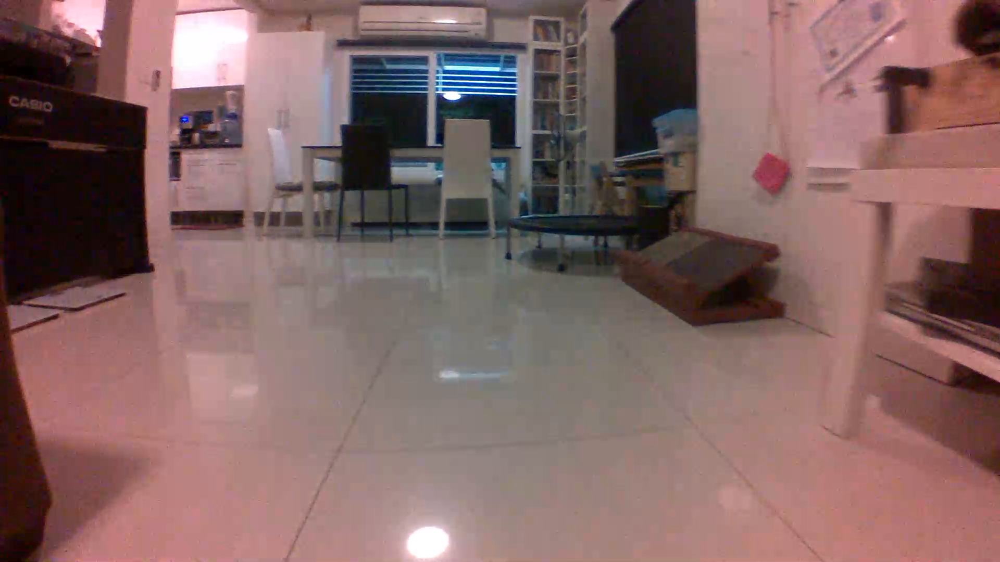

Frame 2

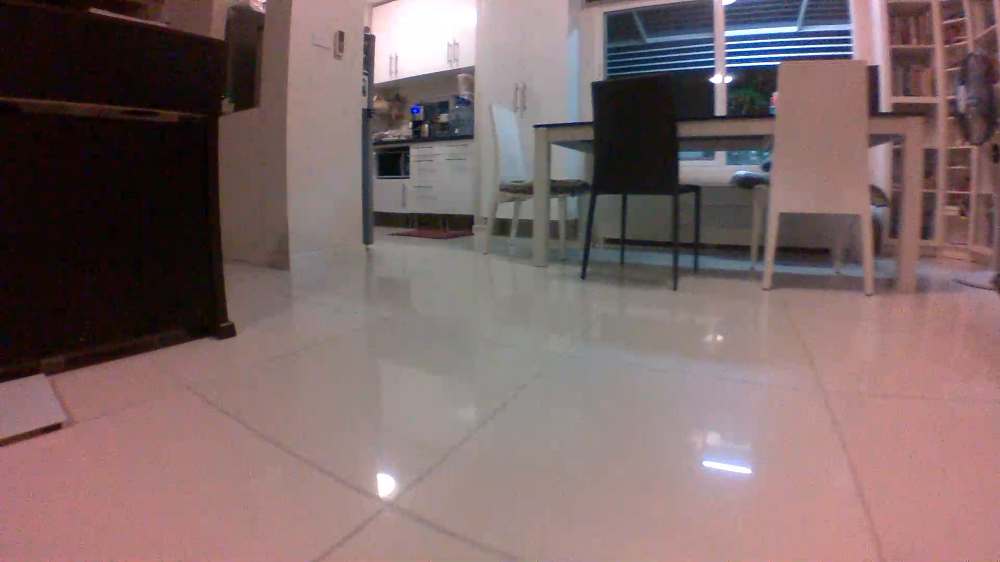

The result from AKAZE seems to be much better. There are more inlier points using AKAZE, although the inlier ratio is higher for ORB.

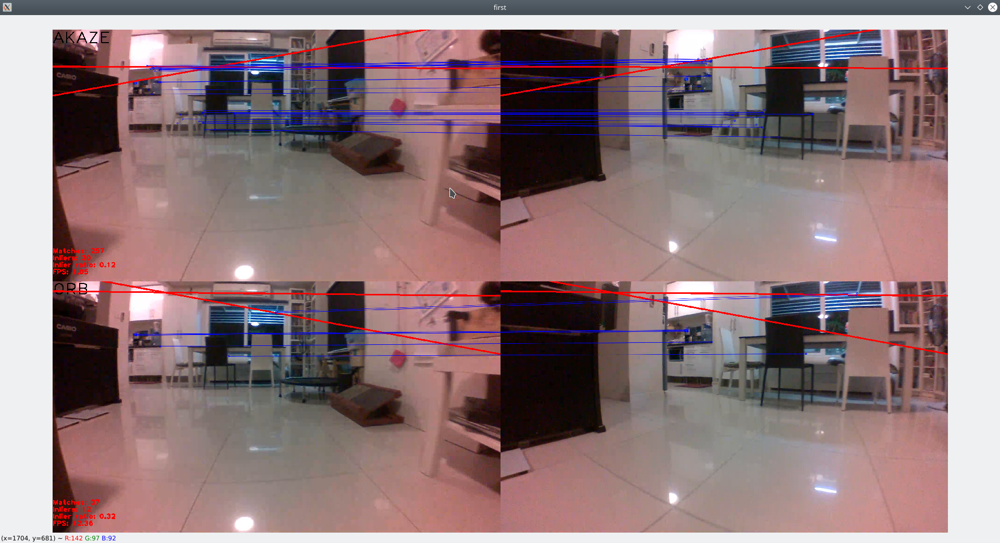

**AKAZE**<br>
The keypoints identified by AKAZE in the first frame were 2984.<br>
The initially matched points between two frames using AKAZE were 257.<br>
The significant points which passed the distance condition were 36.<br>
The number of inliers using Essential Matrix calculation were 30.

**ORB**<br>
The keypoints identified by ORB in the first frame were 500.<br>
The initially matched points between two frames using AKAZE were 37.<br>
The significant points which passed the distance condition were 12.<br>
The number of inliers using Essential Matrix calculation were 12.


AKAZE identified more keypoints than ORB. Among the matched points, most of AKAZE keypoints were eliminated by the distance test. In comparison, it seems that ORB calculated less keypoints but as a ratio, more of them were significant.

Since E matrix computed using AKAZE features gives closer values to zero for the product X.T@np.linalg.inv(K.T)@E@np.linalg.inv(K)@X', it appears that AKAZE features are more accurate for this application.

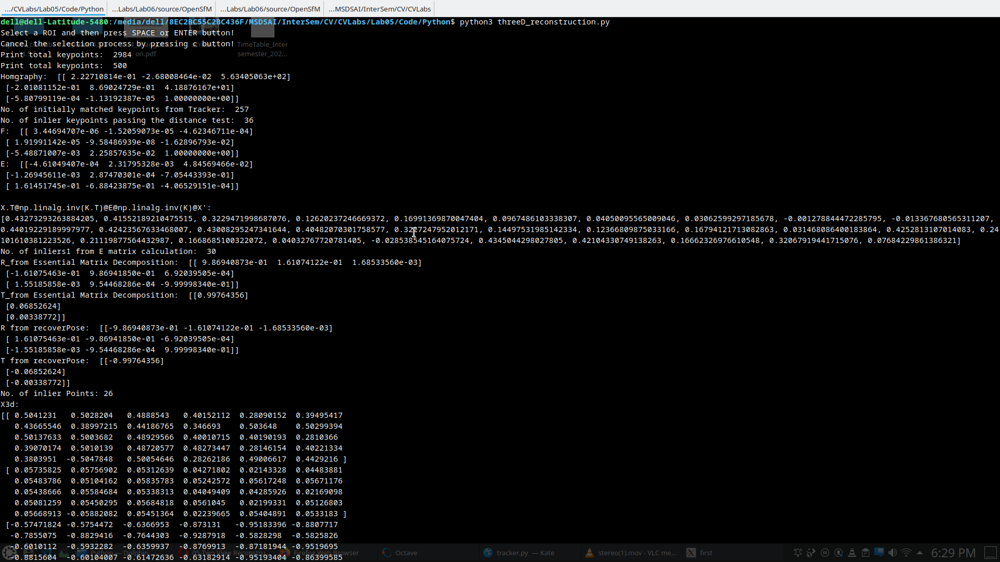

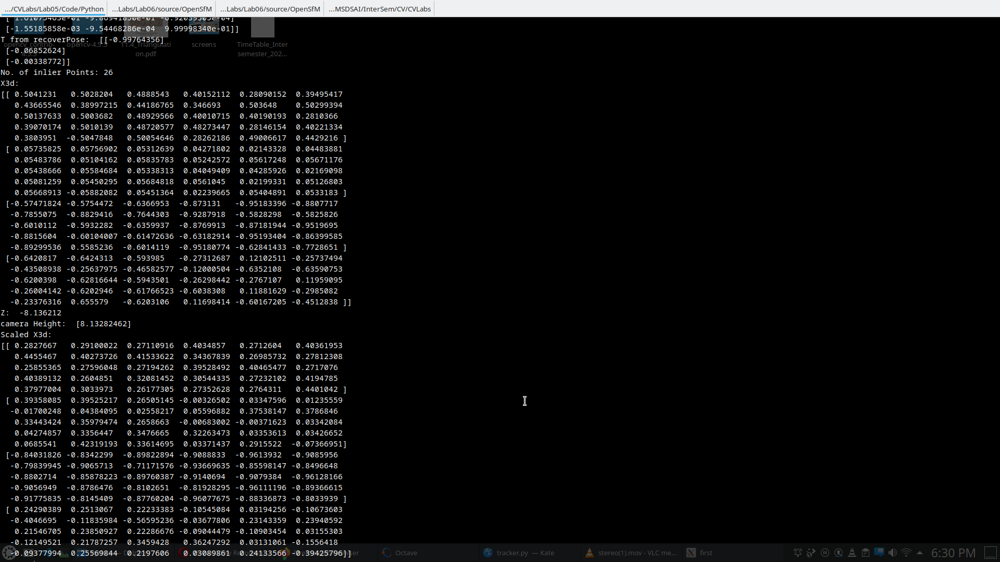

Reconstructed 3D Points

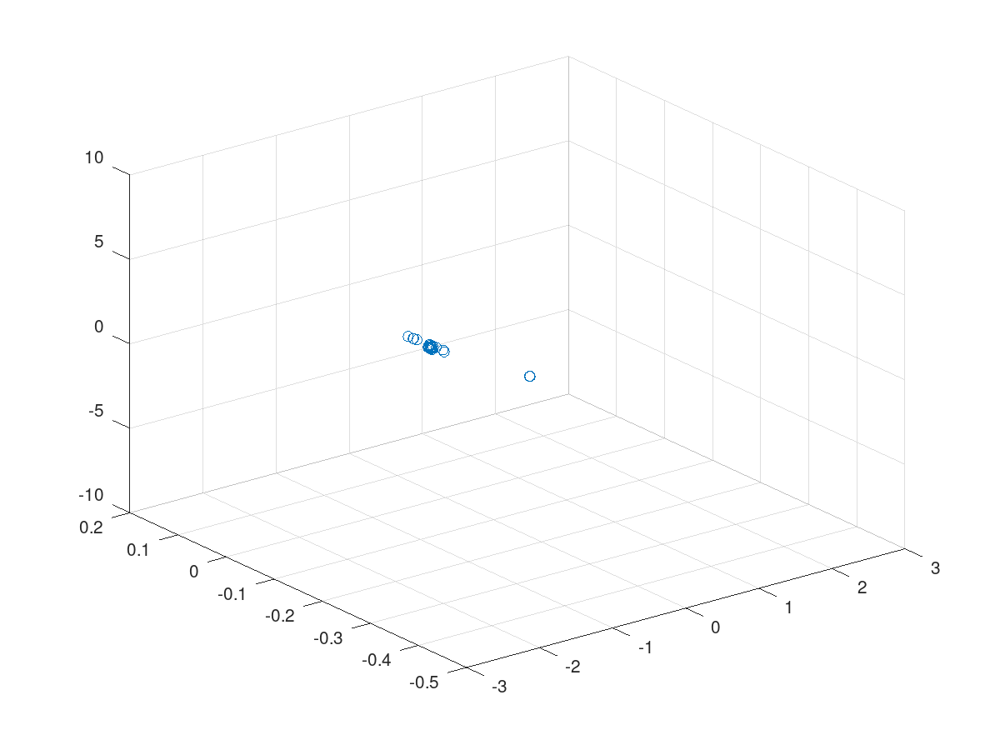

#### Scaled Points - scaled using camera height

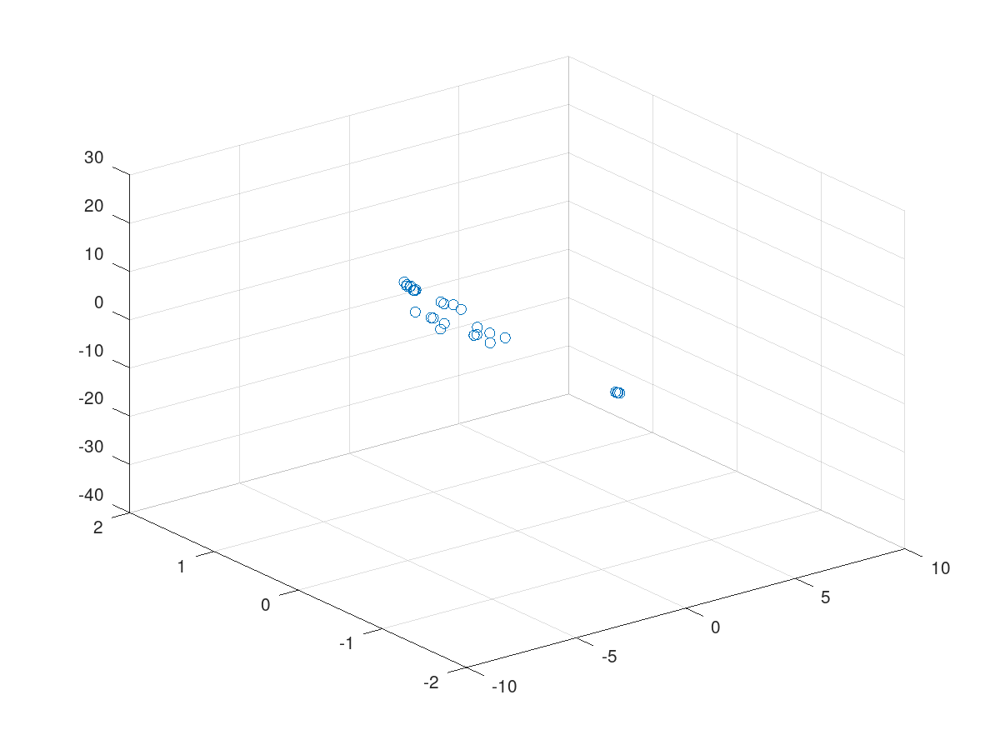

In [ ]:
# addition to utils.py

class cameraParameters:
    def __init__(self, camera_parameters_file):
        self.cameraMatrix = []
        self.h = 0
        self.w = 0
        self.dist_coeff = []
        self.rvecs = []
        self.tvecs = []
        self.read(camera_parameters_file)
        
    def read(self, camera_parameters_file):
        fileStorage = cv2.FileStorage(camera_parameters_file, cv2.FILE_STORAGE_READ)
        if not fileStorage.isOpened():
            return False

        self.cameraMatrix = fileStorage.getNode("Camera_matrix").mat()
        self.dist_coeff = fileStorage.getNode("dist").mat()
        self.h = int(fileStorage.getNode("image_height").real())
        self.w = int(fileStorage.getNode("image_width").real())
        self.rvecs = fileStorage.getNode("rvecs").mat().squeeze(0)
        self.tvecs = fileStorage.getNode("tvecs").mat().squeeze(0)
        fileStorage.release()
        return True
        
def openCalibrationSettings(filename):

    try:
        fs = cv2.FileStorage(filename, cv2.FILE_STORAGE_READ)
        h = fs.getNode("image_height")
        w = fs.getNode("image_width")
        mtx = fs.getNode("Camera_matrix").mat()
        dist = fs.getNode("dist").mat()
        rvecs = fs.getNode("rvecs").mat().squeeze(0)
        tvecs = fs.getNode("tvecs").mat().squeeze(0)
        print("Camera matrix : \n")
        print(mtx)
        print("dist : \n")
        print(dist)
        # print("rvecs : \n")
        # print(rvecs)
        # print("tvecs : \n")
        # print(tvecs)
        fs.release()
        return h, w, mtx, dist, rvecs, tvecs
    except:
        print("Error occured in reading file.")
        raise ValueError()

def getReconstructedP_Matrix(E):
    U, W, Vt = np.linalg.svd(E)
    W = np.array([[0, -1, 0],
                [1, 0, 0],
                [0, 0, 1]])
    u3 = U[:,2][:,np.newaxis]
    #print("u3:\n", u3.shape)
    P_prime_1 = np.concatenate((U@W@Vt, u3), axis=1)
    P_prime_2 = np.concatenate((U@W@Vt, -u3), axis=1)
    P_prime_3 = np.concatenate((U@W.T@Vt, u3), axis=1)
    P_prime_4 = np.concatenate((U@W.T@Vt, -u3), axis=1)

    if P_prime_1[0,0]<0:
        P_prime_1 = -P_prime_1
    if P_prime_2[0,0]<0:
        P_prime_2 = -P_prime_2
    if P_prime_3[0,0]<0:
        P_prime_3 = -P_prime_3
    if P_prime_4[0,0]<0:
        P_prime_4 = -P_prime_4
        
    
    P_options = (P_prime_1, P_prime_2, P_prime_3, P_prime_4)
    
    return P_options
        
def null(P):
    U,W,Vt = np.linalg.svd(P)
    h = Vt[-1,:]/Vt[-1,-1]
    return h

def getReconstructed_X(point_x, point_x_prime, P, P_prime):
    x = point_x[0]
    y = point_x[1]
    xp = point_x_prime[0]
    yp = point_x_prime[1]

    A = np.zeros((4, P.shape[1]))
    A[0,:] = y*P[2,:] - P[1,:]
    A[1,:] = P[0,:] - x*P[2,:]
    A[2,:] = yp*P_prime[2,:] - P_prime[1,:]
    A[3,:] = P_prime[0,:] - xp*P_prime[2,:]

    X = null(A)
    X = X/X[3]
    return X

def triangulate(P, P_prime, imagePoints, imagePoints_prime):
    
    reconstructed_X = []
    for i in range(imagePoints.shape[1]):
        point_x = imagePoints[0,i,:]
        point_x_prime = imagePoints_prime[0,i,:]
        X = getReconstructed_X( point_x, point_x_prime, P, P_prime )
        reconstructed_X.append( X )
        
    reconstructed_X = np.array(reconstructed_X)
        
    return reconstructed_X

def getNumberCorrectPoints(reconstructed_X, P, P_prime):
    correct = 0
    for X in reconstructed_X:
        w = (P @ X)[2]
        M = P[:,:3]
        M_prime = P_prime[:,:3]
        
        d1 = np.sign(np.linalg.det(M)) * w / X[3]
        d2 = np.sign(np.linalg.det(M_prime)) * w / X[3]
        if d1>0 and d2>0:
            correct+=1
    return correct

def getCorrectP_prime(P_options, imagePoints, imagePoints_prime):

    P = np.concatenate((np.eye(3), np.zeros((3,1))), axis=1)
    n_correct = []
    for P_prime in P_options:
        reconstructed_X = triangulate(P, P_prime, imagePoints, imagePoints_prime)
        #print("\nreconstructed_X")
        #print(reconstructed_X)
        correct = getNumberCorrectPoints( reconstructed_X, P, P_prime )
        n_correct.append(correct)
        
    n = np.argmax(n_correct)
    return P_options[n]

def showUndistorted(img, mtx, dist):
    # Return undistorted images
    
    h,  w = img.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))
    
    mapx, mapy = cv2.initUndistortRectifyMap(mtx, dist, None, newcameramtx, (w,h), 5)
    res = cv2.remap(img, mapx, mapy, cv2.INTER_LINEAR)
    
    # crop the image
    x, y, w, h = roi
    res = res[y:y+h, x:x+w]
    return res
 

In [ ]:
# tracker.py

import numpy as np
import time
from stats import Stats
from utils import *
from homography import Homography

akaze_thresh:float = 3e-4 # AKAZE detection threshold set to locate about 1000 keypoints
ransac_thresh:float = 2.5 # RANSAC inlier threshold
nn_match_ratio:float = 0.8 # Nearest-neighbour matching ratio
bb_min_inliers:int = 100 # Minimal number of inliers to draw bounding box
stats_update_period:int = 10 # On-screen statistics are updated every 10 frames

class Tracker:
    def __init__(self, detector, matcher):
        self.detector = detector
        self.matcher = matcher
        self.camParams = cameraParameters("rpi_camera_parameters.yml")
        #self.homographyData = Homography("robot-homography.yml")

    def setFirstFrame(self, frame, bb, title:str):
        iSize = len(bb)
        stat = Stats()
        ptContain = np.zeros((iSize, 2))
        i = 0
        for b in bb:
            #ptMask[i] = (b[0], b[1])
            ptContain[i, 0] = b[0]
            ptContain[i, 1] = b[1]
            i += 1
        
        self.first_frame = frame.copy()
        matMask = np.zeros(frame.shape, dtype=np.uint8)
        cv2.fillPoly(matMask, np.int32([ptContain]), (255,0,0))
        
        #h,  w = frame.shape[:2]
        #self.camParams.cameraMatrix, roi = cv2.getOptimalNewCameraMatrix(self.camParams.cameraMatrix, self.camParams.dist_coeff, (w, h), 1, (w,h))
        
        
        # cannot use in ORB
        # self.first_kp, self.first_desc = self.detector.detectAndCompute(self.first_frame, matMask)
        
        #print("Camera Parameters:")
        #print(self.camParams.cameraMatrix)
        #print("homography data:")
        #print(self.homographyData.matH)
        
        # find the keypoints from the selected image with ORB
        kp = self.detector.detect(self.first_frame,None)
        
        #kp = self.undistort(kp)
        
        # compute the descriptors with ORB
        self.first_kp, self.first_desc = self.detector.compute(self.first_frame, kp)
        
        
        
        print("Print total keypoints: ", len(self.first_kp))
        #print("Printing first detected Keypoint from first Frame:")
        #print("x: ", self.first_kp[0].pt[0])
        #print("y: ", self.first_kp[0].pt[1])
        #print("angle of rotation: ", self.first_kp[0].angle)
        #print("size: ", self.first_kp[0].size)
        
        res = cv2.drawKeypoints(self.first_frame, self.first_kp, None, color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        
        stat.keypoints = len(self.first_kp)
        #drawBoundingBox(self.first_frame, bb);

        cv2.imshow("key points of {0}".format(title), res)
        cv2.waitKey(0)
        cv2.destroyWindow("key points of {0}".format(title))

        cv2.putText(self.first_frame, title, (0, 60), cv2.FONT_HERSHEY_PLAIN, 5, (0,0,0), 4)
        self.object_bb = bb  # Object bounding box
        return stat

        
    def undistort(self, kp):
        matchpoints = []
        for keypoint in kp:
            k = np.array([keypoint.pt[0], keypoint.pt[1]], dtype=np.float32)
            matchpoints.append(k)
            
        matchpoints = np.array(matchpoints)
        kpoints = cv2.undistortPoints(matchpoints, self.camParams.cameraMatrix, self.camParams.dist_coeff)
        for i, keypoint in enumerate(kp):
            keypoint.pt = (kpoints[i][0][0], kpoints[i][0][1])
        
        return kp
        
    def get_inlierPoints(self, kp, matches):
        matched1 = []
        matched2 = []
        matched1_keypoints = []
        matched2_keypoints = []
        good = []

        for i,(m,n) in enumerate(matches):
            if m.distance < nn_match_ratio * n.distance:    # nearest neighbour matching ratio
                good.append(m)    # append m to good points if 1stPoint_distance<0.8*2ndPoint_distance
                matched1_keypoints.append(self.first_kp[matches[i][0].queryIdx]) # matched keypoint from 1st image
                matched2_keypoints.append(kp[matches[i][0].trainIdx]) # matched keypoint from second image

        matched1 = np.float32([ self.first_kp[m.queryIdx].pt for m in good ]).reshape(-1,1,2) # keypoints from 1st (original) image
        matched2 = np.float32([ kp[m.trainIdx].pt for m in good ]).reshape(-1,1,2)  # matched keypoints from 2nd image
        
        return good, matched1, matched2, matched1_keypoints, matched2_keypoints
        
    def get_inliers(self, inlier_mask, good, matched1, matched2, matched1_keypoints, matched2_keypoints):
        inliers1 = []
        inliers2 = []
        inliers1_keypoints = []
        inliers2_keypoints = []
        
        # From matched points, extract points classed as inliers through RANSAC 
        for i in range(len(good)):      # Run for every matched point that is significant
            if (inlier_mask[i] > 0):    # inlier_mask computed from RANSAC
                new_i = len(inliers1)
                inliers1.append(matched1[i])
                inliers2.append(matched2[i])
                inliers1_keypoints.append(matched1_keypoints[i])
                inliers2_keypoints.append(matched2_keypoints[i])
                
        inlier_matches = [cv2.DMatch(_imgIdx=0, _queryIdx=idx, _trainIdx=idx,_distance=0) for idx in range(len(inliers1))]
        inliers1 = np.array(inliers1, dtype=np.float32)
        inliers2 = np.array(inliers2, dtype=np.float32)
        
        return inlier_matches, inliers1, inliers2, inliers1_keypoints, inliers2_keypoints
    
    def calcE_ransac(self, imagePoints, imagePoints_prime):
        K = self.camParams.cameraMatrix
        dist_coeff = self.camParams.dist_coeff

        #imagePoints = cv2.undistortPoints(imagePoints, cameraMatrix=K, distCoeffs=dist_coeff)
        #imagePoints_prime = cv2.undistortPoints(imagePoints_prime, cameraMatrix=K, distCoeffs=dist_coeff)
        
        F, mask_F = cv2.findFundamentalMat(imagePoints, imagePoints_prime, cv2.FM_RANSAC)
        ransac_E, mask = cv2.findEssentialMat(imagePoints, imagePoints_prime)
        
        return ransac_E, mask, F

    def get_inliers_from_EMatrix(self, E, E_mask, inliers1, inliers2, inliers1_keypoints, inliers2_keypoints):
        idx, _ = np.where(E_mask == True)
        new_inlier1_kps = []
        new_inlier2_kps = []
        #print("E_mask:", E_mask.shape)
        #print("idx:", idx.shape)
        #print("oidx:", oidx.shape)
        #print("idx:", idx)
        #print("oidx:", oidx)
        for i in range(len(inliers1_keypoints)):
            if i in idx:
                new_inlier1_kps.append(inliers1_keypoints[i])
                new_inlier2_kps.append(inliers2_keypoints[i])
        
        new_inliers1 = inliers1[idx]
        new_inliers2 = inliers2[idx]
        #print("inliers1: ", new_inliers1.shape)
        #print("inliers2: ", new_inliers2.shape)
        #print("no. of refined inliers: ", new_inliers1.shape)
        
        zeros = []
        K = self.camParams.cameraMatrix
        
        for i in range(len(new_inlier1_kps)):
            X = np.array([new_inliers1[i][0,0], new_inliers1[i][0,1], 1])[:,np.newaxis]
            Xp = np.array([new_inliers2[i][0,0], new_inliers2[i][0,1], 1])[:,np.newaxis]
            #print("X: ", X.shape)
            val = X.T@np.linalg.inv(K.T)@E@np.linalg.inv(K)@Xp
            zeros.append(val.item())
            
        print("\nX.T@np.linalg.inv(K.T)@E@np.linalg.inv(K)@X':")
        print(zeros)
        
        inlier_matches = [cv2.DMatch(_imgIdx=0, _queryIdx=idx, _trainIdx=idx,_distance=0) for idx in range(len(new_inliers1))]
        
        return inlier_matches, new_inliers1, new_inliers2, new_inlier1_kps, new_inlier2_kps
        
    def drawLine(self, lines1, lines2, img):
        _, c, _ = img.shape
        line1 = lines1[0]
        line2 = lines2[0]
        
        K = self.camParams.cameraMatrix
        dist_coeff = self.camParams.dist_coeff
        
        ya = 0
        x0,y0 = map(int, [0, -line1[2]/line1[1] + ya ])
        x1,y1 = map(int, [c,  ya+(-(line1[2]+line1[0]*c)/line1[1]) ])
        x = np.array([[x0,y0],[x1,y1]])
        x = x[:,np.newaxis,:].astype(np.float32)
        #print("x shape: ", x.shape)
        
        #x = cv2.undistortPoints(x, cameraMatrix=K, distCoeffs=dist_coeff)
        x = x.astype(np.int32)
        #print(x)
        #img2 = cv2.line(img, (x0,y0), (x1,y1), (0, 0, 255), 5)
        img2 = cv2.line(img, (x[0,0,0],x[0,0,1]), (x[1,0,0],x[1,0,1]), (0, 0, 255), 5)
        
        x0,y0 = map(int, [0, -line2[2]/line2[1] + ya ])
        x1,y1 = map(int, [c, ya + (-(line2[2]+line2[0]*c)/line2[1]) ])
        x = np.array([[x0,y0],[x1,y1]])
        x = x[:,np.newaxis,:].astype(np.float32)
        #print("x shape: ", x.shape)
        #x = cv2.undistortPoints(x, cameraMatrix=K, distCoeffs=dist_coeff)
        x = x.astype(np.int32)
        #print(x)
        #img2 = cv2.line(img, (x0,y0), (x1,y1), (0, 0, 255), 5)
        img2 = cv2.line(img2, (x[0,0,0],x[0,0,1]), (x[1,0,0],x[1,0,1]), (0, 0, 255), 5)
        #img2 = cv2.line(img2, (x0,y0), (x1,y1), (0, 0, 255), 5)
        
        return img2


    def process(self, frame):
        stat = Stats()
        start_time = time.time()
        
        kp = self.detector.detect(frame, None)
        #kp = self.undistort(kp)
        kp, desc = self.detector.compute(frame, kp)
        
        #kp, desc = self.detector.detectAndCompute(frame, None)
        stat.keypoints = len(kp)
        matches = self.matcher.knnMatch(self.first_desc, desc, k=2)
        #print("matches:", matches[0])
        
        good, matched1, matched2, matched1_keypoints, matched2_keypoints = self.get_inlierPoints(kp, matches)
        
        stat.matches = len(matched1)  # Update stats of matched keypoints in image
        
        # Calculate Homography if equat to or more than four points are matched
        homography = None
        if (len(matched1) >= 4):
            homography, inlier_mask = cv2.findHomography(matched1, matched2, cv2.RANSAC, ransac_thresh)
        print("Homgraphy: ", homography)
        print("No. of initially matched keypoints from Tracker: ", len(matched1))
        dt = time.time() - start_time  # Time passed 
        stat.fps = 1. / dt             # Calculate FPS and update in stats
        
        # if matched points are less than 4, then put inliers to zero and return concatenated images
        if (len(matched1) < 4 or homography is None):
            res = cv2.hconcat([self.first_frame, frame])
            stat.inliers = 0
            stat.ratio = 0
            return res, stat
        
        inlier_matches, inliers1, inliers2, inliers1_keypoints, inliers2_keypoints = self.get_inliers(inlier_mask, good,                                        
                                                                                                            matched1, matched2, matched1_keypoints, matched2_keypoints)
        print("No. of inlier keypoints passing the distance test: ", len(inliers1))
        #E, E_mask = cv2.findEssentialMat(inliers1, inliers2) #, self.camParams.cameraMatrix, 'RANSAC')
        #print("E: ", E)
        
        E, E_mask, F = self.calcE_ransac(inliers1, inliers2)
        
        
        print("F: ", F)
        print("E: ", E)
        # print("total correct in E:", mask.shape, mask.sum())
        inlier_matches, inliers1, inliers2, inliers1_keypoints, inliers2_keypoints = self.get_inliers_from_EMatrix(E, E_mask, inliers1, inliers2, inliers1_keypoints, inliers2_keypoints)
        
        print("No. of inliers1 from E matrix calculation: ", inliers1.shape[0])
        
        P_options = getReconstructedP_Matrix(E)
        P = getCorrectP_prime(P_options, inliers1, inliers2)
        #print("P: ", P)
        R = P[:,:3]
        T = P[:,3:]
        print("R_from Essential Matrix Decomposition: ", R)
        print("T_from Essential Matrix Decomposition: ", T)
        
        corrected_inliers1, corrected_inliers2 = cv2.correctMatches(E, inliers1.transpose(1,0,2), inliers2.transpose(1,0,2))
        points, R, T, mask = cv2.recoverPose(E, corrected_inliers1, corrected_inliers2, self.camParams.cameraMatrix)
        print("R from recoverPose: ", R)
        print("T from recoverPose: ", T)
        print("No. of inlier Points:", points)
        
        # Construct P matrix
        P1 = np.concatenate((self.camParams.cameraMatrix @ np.eye(3), self.camParams.cameraMatrix @ np.zeros((3,1))), axis=1)
        P2 = np.concatenate((self.camParams.cameraMatrix@R, self.camParams.cameraMatrix@T), axis=1)
        print("C: ", null(P2))
        X3d = cv2.triangulatePoints(P1, P2, corrected_inliers1, corrected_inliers2)
        print("X3d:")
        print(X3d)
        
        
        
        
        # SCALE AMBIGUITY
        X3d_cor = X3d[:]/X3d[-1]
        z = X3d_cor[2,:]
        groundPixel_z = np.min(z)
        cameraHeight = T[2]-np.min(z)
        T[2] = cameraHeight
        print("Z: ", np.min(z))
        print("camera Height: ", cameraHeight)
        
        # Reconstruct P matrix
        T1 = np.array([[0],[0],[cameraHeight+np.min(z)]], dtype=np.float32)
        P1 = np.concatenate((self.camParams.cameraMatrix @ np.eye(3), self.camParams.cameraMatrix @ T1), axis=1)
        P2 = np.concatenate((self.camParams.cameraMatrix@R, self.camParams.cameraMatrix@T), axis=1)
        
        X3d = cv2.triangulatePoints(P1, P2, corrected_inliers1, corrected_inliers2)
        print("Scaled X3d:")
        print(X3d)
        
        stat.inliers = len(inliers1)
        stat.ratio = stat.inliers * 1.0 / stat.matches
        
        bb = np.array([self.object_bb], dtype=np.float32)
        new_bb = cv2.perspectiveTransform(bb, homography)
        frame_with_bb = frame.copy()
        first_frame = self.first_frame.copy()
        
        #frame_with_bb = showUndistorted(frame_with_bb, self.camParams.cameraMatrix, self.camParams.dist_coeff)
        #first_frame = showUndistorted(self.first_frame.copy(), self.camParams.cameraMatrix, self.camParams.dist_coeff)
        if (stat.inliers >= bb_min_inliers):
            drawBoundingBox(frame_with_bb, new_bb[0])
        
        eplines1 = cv2.computeCorrespondEpilines(inliers2.reshape(-1,1,2), 2, F)
        eplines1 = eplines1.reshape(-1, 3)
        
        eplines2 = cv2.computeCorrespondEpilines(inliers1.reshape(-1,1,2), 1, F)
        eplines2 = eplines2.reshape(-1,3)
        
        first_frame = self.drawLine(eplines1, eplines2, first_frame)
        frame_with_bb = self.drawLine(eplines2, eplines1, frame_with_bb)
        
        res = cv2.drawMatches(first_frame, inliers1_keypoints, frame_with_bb, inliers2_keypoints, inlier_matches, None, matchColor=(255, 0, 0), singlePointColor=(255, 0, 0))
        return res, stat

    def getDetector(self):
        return self.detector
 


In [ ]:
# threeD_reconstruction.py

import numpy as np
import time
from stats import Stats
from utils import *
from tracker import Tracker

akaze_thresh:float = 3e-4 # AKAZE detection threshold set to locate about 1000 keypoints
ransac_thresh:float = 2.5 # RANSAC inlier threshold
nn_match_ratio:float = 0.8 # Nearest-neighbour matching ratio
bb_min_inliers:int = 100 # Minimal number of inliers to draw bounding box
stats_update_period:int = 10 # On-screen statistics are updated every 10 frames


def recontruct_points(img1, img2):
    ''' Reconstructs 3D points given a pair of non-planar images'''
    
    akaze_stats = Stats()
    orb_stats = Stats()

    akaze = cv2.AKAZE_create()
    akaze.setThreshold(akaze_thresh)

    orb = cv2.ORB_create()

    matcher = cv2.DescriptorMatcher_create("BruteForce-Hamming")

    akaze_tracker = Tracker(akaze, matcher)
    orb_tracker = Tracker(orb, matcher)

    cv2.namedWindow("first", cv2.WINDOW_NORMAL | cv2.WINDOW_KEEPRATIO | cv2.WINDOW_GUI_EXPANDED);
    cv2.imshow("first", img1)
    uBox = cv2.selectROI("first", img1);
    bb = []
    bb.append((uBox[0], uBox[1]))
    bb.append((uBox[0] + uBox[2], uBox[0] ))
    bb.append((uBox[0] + uBox[2], uBox[0] + uBox[3]))
    bb.append((uBox[0], uBox[0] + uBox[3]))
    stat_a = akaze_tracker.setFirstFrame(img1, bb, "AKAZE",);
    stat_o = orb_tracker.setFirstFrame(img1, bb, "ORB");  # returns no. of keypoints detected

    akaze_draw_stats = stat_a.copy()
    orb_draw_stats = stat_o.copy()

    update_stats = True
    
    akaze_res, stat = akaze_tracker.process(img2)
    akaze_stats + stat
    if (update_stats):
        akaze_draw_stats = stat
    orb.setMaxFeatures(stat.keypoints)
    orb_res, stat = orb_tracker.process(img2)
    orb_stats + stat
    if (update_stats):
        orb_draw_stats = stat
    drawStatistics(akaze_res, akaze_draw_stats)
    drawStatistics(orb_res, orb_draw_stats)
    res_frame = cv2.vconcat([akaze_res, orb_res])
    # cv2.imshow(video_name, akaze_res)
    cv2.imshow("first", res_frame)
    cv2.waitKey(0)

    akaze_stats / (1)
    orb_stats / (1)
    printStatistics("AKAZE", akaze_stats);
    printStatistics("ORB", orb_stats);
    return 0

if __name__=="__main__":
    img1 = cv2.imread("frame-013.png")
    img2 = cv2.imread("frame-017.png")
    recontruct_points(img1, img2)
